

## Assignment 1 [Part A] Cleaning and EDA

**_Yitong Liu,  NUID:  001822175_**

### Dataset Description:

    The datasets I picked is a history of crime statistics from 2004 to 2016 per province and station for South Africa. The crime statistics generated by SAPS is an important link in the value chain of the statistics system informs policy development and planning in the criminal justice system. Analysing these data ensures can help policy-makers with making policy decisions. There are such 4 kinds of fields included in the raw datasets: 
 > 
  * **Province**
  * **Station**
  * **Category**
  * **Year_Range**  --There are 11 years ranges(2005-2006, 2006-2007,...,2015-2016).
  *     **Police_bounds** --This is the file used to get the map of the South Africa.(Police_bounds.shp)

  14 columns of data included totally for above kinds of data, and all the columns will be kept in the dataset.    
 
 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import csv
## read the data from csv
CrimeStatistics = pd.read_csv('CrimeStatistics.csv', header=0)
## show the data samples of first 10 lines
CrimeStatistics.head()
plt.rcParams['figure.figsize'] = (15, 9)

In [2]:
## read the data from csv
CrimeStatistics = pd.read_csv('CrimeStatistics.csv', header=0)
## show the data samples of first 10 lines
CrimeStatistics.head()
plt.rcParams['figure.figsize'] = (15, 9)

### Data cleaning

* Are there missing values?
* Are there inappropraite values?
* Remove or impute any bad data.


In [3]:
## show the data samples of first 10 lines
CrimeStatistics.head(10)

,Province,Station,Category,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030
5,North West,Rustenburg,All theft not mentioned elsewhere,4239,4173,3398,3388,2737,2117,2139,1914,1897,1868,1862
6,Kwazulu/Natal,Durban Central,All theft not mentioned elsewhere,4162,4529,3499,3353,3183,2933,3219,3418,3390,2872,2865
7,Gauteng,Brooklyn,All theft not mentioned elsewhere,3931,3583,2878,2568,2415,2162,2050,1883,2442,2200,2107
8,Gauteng,Booysens,All theft not mentioned elsewhere,3681,3277,2849,2603,2580,3107,2568,1339,1290,1039,943
9,Gauteng,Hillbrow,All theft not mentioned elsewhere,3489,2914,3093,2706,2250,2298,2051,1835,1610,1607,1618


In [4]:
## show the data samples of last 10 lines
CrimeStatistics.tail(10)

,Province,Station,Category,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
30851,Limpopo,Westenburg,All theft not mentioned elsewhere,0,0,0,0,0,0,0,698,758,644,691
30852,Free State,Zamdela,Common assault,0,0,0,0,0,0,567,649,756,562,692
30853,Gauteng,Mamelodi East,Assault with the intent to inflict grievous bo...,0,489,834,774,797,588,645,650,664,766,732
30854,Gauteng,Diepsloot,Assault with the intent to inflict grievous bo...,0,0,0,0,0,156,590,594,612,528,776
30855,Kwazulu/Natal,Kwamashu E,Shoplifting,0,0,0,0,0,170,364,439,468,829,802
30856,Western Cape,Belhar,All theft not mentioned elsewhere,0,0,250,837,710,746,839,762,882,1015,829
30857,Gauteng,Moffatview,All theft not mentioned elsewhere,0,0,0,0,0,0,0,1012,1195,1294,991
30858,Western Cape,Belhar,Drug-related crime,0,0,54,238,291,583,840,1117,1197,1237,1401
30859,Western Cape,Lentegeur,All theft not mentioned elsewhere,0,0,0,0,0,0,0,0,1300,2346,1989
30860,Western Cape,Lentegeur,Drug-related crime,0,0,0,0,0,0,0,0,1126,1933,2050


In [5]:
# show how many rows of the dataset
len(CrimeStatistics)

30861

### Data Cleaning
   * Any there Missing values？ 
   
      ** There isn't any mising values for each columns. The dataset itself has some values equals to 0, and in fact, it is reasonable to be zero. So I didnt't change these 0 with the mean of each column, or delete these 0. **

In [7]:
CrimeStatistics.isnull().sum()

Province     0
Station      0
Category     0
2005-2006    0
2006-2007    0
2007-2008    0
2008-2009    0
2009-2010    0
2010-2011    0
2011-2012    0
2012-2013    0
2013-2014    0
2014-2015    0
2015-2016    0
dtype: int64

In [8]:
# the info of the dataset, and the data formats are showed below, int and object.
CrimeStatistics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30861 entries, 0 to 30860
Data columns (total 14 columns):
Province     30861 non-null object
Station      30861 non-null object
Category     30861 non-null object
2005-2006    30861 non-null int64
2006-2007    30861 non-null int64
2007-2008    30861 non-null int64
2008-2009    30861 non-null int64
2009-2010    30861 non-null int64
2010-2011    30861 non-null int64
2011-2012    30861 non-null int64
2012-2013    30861 non-null int64
2013-2014    30861 non-null int64
2014-2015    30861 non-null int64
2015-2016    30861 non-null int64
dtypes: int64(11), object(3)
memory usage: 3.3+ MB


### Data cleaning

* Are there missing values?
* Are there inappropraite values?
* Remove or impute any bad data.


In [9]:
pd.options.display.float_format = '{:,.3f}'.format

In [10]:
CrimeStatistics.describe()

,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
count,"30,861.000","30,861.000","30,861.000","30,861.000","30,861.000","30,861.000","30,861.000","30,861.000","30,861.000","30,861.000","30,861.000"
mean,70.528,69.302,67.154,68.756,69.518,67.767,68.260,69.701,71.417,71.498,70.736
std,205.492,198.038,186.761,187.174,185.515,181.866,183.334,184.812,187.635,185.019,179.364
min,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,0.000,0.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000,1.000
50%,8.000,8.000,8.000,9.000,9.000,9.000,10.000,10.000,11.000,11.000,11.000
75%,49.000,50.000,50.000,52.000,54.000,52.000,53.000,55.000,56.000,57.000,58.000
max,"6,692.000","6,341.000","6,316.000","6,803.000","6,571.000","6,260.000","6,108.000","6,310.000","6,044.000","5,335.000","5,176.000"


####   From the plot above, 
we can get the count, mean, std, min, max, etc, for each column. Each column stands for the whole data and the total number of criminal cases in south Africa. From the mean, min, max, it can be concluded that the trend went up and went down in these eleven years. 
  

In [3]:
# change the name for each column.
CrimeStatistics.columns = ['Province','Station', 'Category',
              'First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year']

CrimeStatistics.head(5)

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030


In [12]:
CrimeStatistics['Province'].value_counts()

Eastern Cape     5292
Kwazulu/Natal    5022
Western Cape     4050
Gauteng          3861
Free State       2970
Limpopo          2673
Northern Cape    2457
Mpumalanga       2322
North West       2214
Name: Province, dtype: int64

In [13]:
list = ['First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year']

Crimes_Province = CrimeStatistics.groupby(['Province'])['First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year'].sum()

Crimes_Category = CrimeStatistics.groupby(['Category'])['First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year'].sum()

In [14]:
Crimes_Province[list].transpose().plot(kind='line',figsize=(6, 3))
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Evolution by Province')

Text(0.5,1,'Evolution by Province')

In [15]:
Crimes_Province.plot(kind='bar', rot=35)
plt.legend(bbox_to_anchor=(1, 1), loc=2, borderaxespad=0.)
plt.title('Crime per province')

Text(0.5,1,'Crime per province')

### From this plot, it is obvious that Gauteng, Western Cape and Kwazulu/Natal, these three provinces have morecriminal cases compared with other seven provinces; Northern Cape has the least criminal cases in eleven years. There are a lot of factors can cause these trends. Here are my thoughts:

    There are real improvement and good policies in Northern Cape, on the other side, this province has the least population, so this may be the biggest reason that the number of criminal cases are not as big as in other provinces. Also, there is a dataset shows that in the list of population, Gauteng and Kwasulu/Natal are the first and second one , Western Cape is the fourth one. But the number of criminal cases in Western Cape is bigger than in Kwasulu/Natal. So we may conclude that the government has published some better polices to reduce the crime rates. This conclusion is convinced, as the plot of Kwasulu/Natal is relatively denser, but the trend of Western Cape is going up gradually in each year. So we can say the situation deteriorates in Western Cape. And this province requires some staff changes in staff rotaion, police officer training, and investments in police infrastructure.



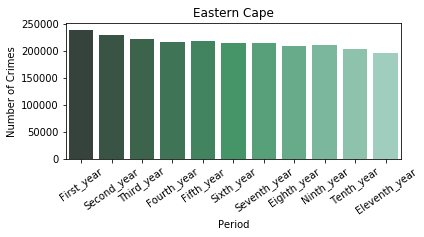

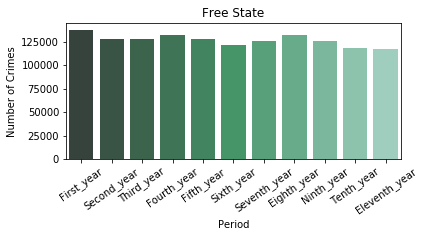

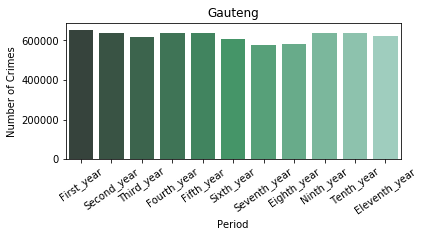

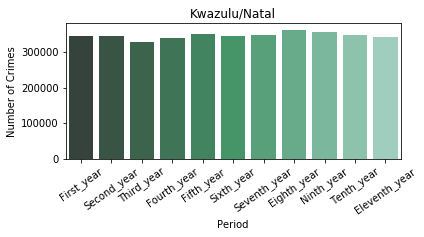

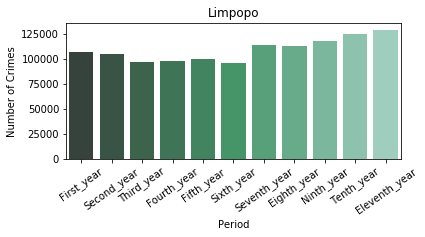

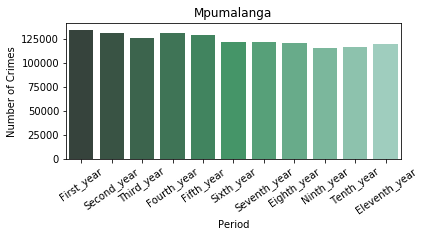

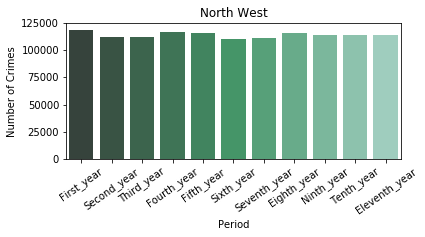

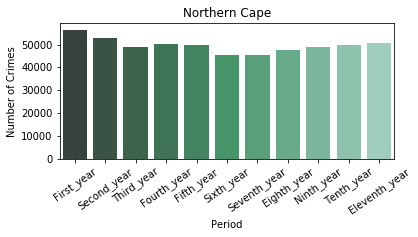

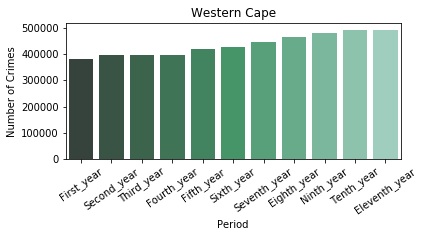

In [125]:
cols = Crimes_Province.transpose().columns
Crimes_Province_transpose = Crimes_Province.transpose()
Crimes_Province_transpose['index'] = Crimes_Province_transpose.index

n_rows=9
n_cols=1

for i in range(n_rows):
    fg,ax = plt.subplots(nrows=1,ncols=1,figsize=(6, 2.5))
    for j in range(n_cols):
        sns.barplot(Crimes_Province_transpose['index'], Crimes_Province_transpose[cols[i]],palette="BuGn_d")
        ax.set_ylabel("Number of Crimes")
        ax.set_xlabel("Period")
        ax.set_xticklabels(Crimes_Province_transpose['index'],rotation=35)
        plt.title(cols[i*n_cols+j])
        

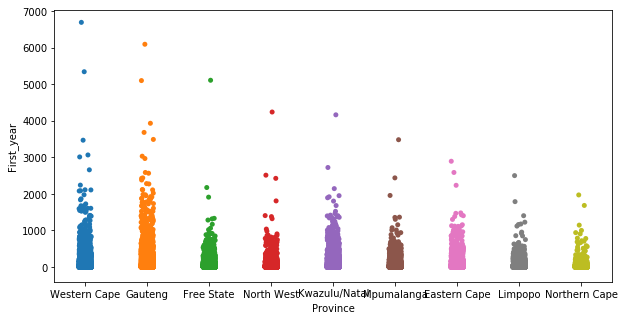

In [100]:
sns.stripplot(x="Province", y="First_year", data=CrimeStatistics, jitter=True)
plt.rcParams['figure.figsize'] = (15, 20)

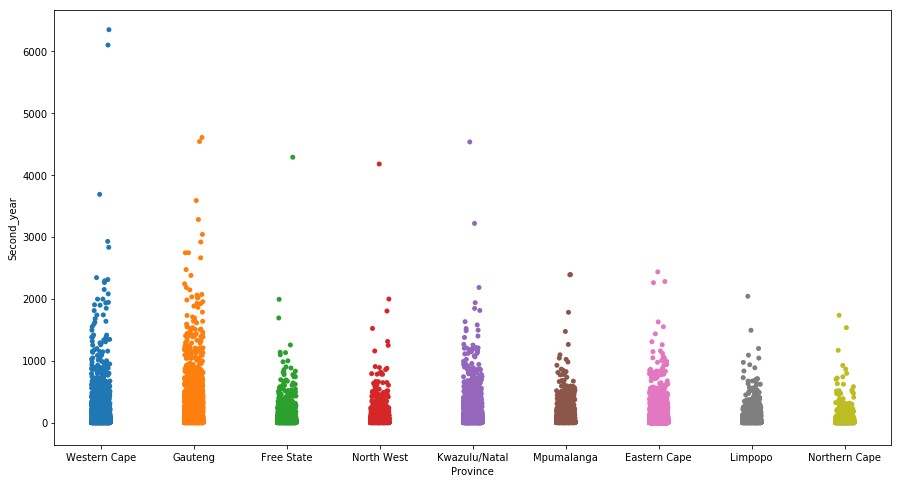

In [118]:
sns.stripplot(x="Province", y="Second_year", data=CrimeStatistics, jitter=True)


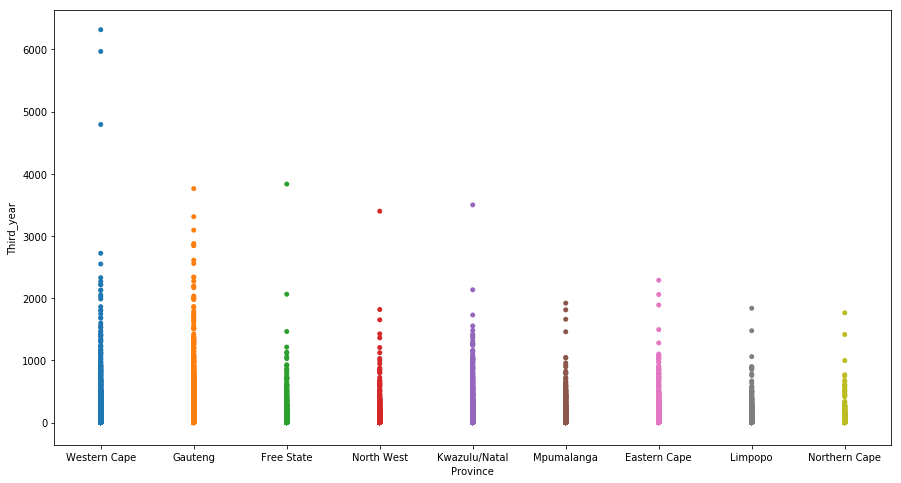

In [117]:
sns.stripplot(x="Province", y="Third_year", data=CrimeStatistics)


### Answer the following questions for the data in each column:


   * Are there anomalies/outliers?
   

In [25]:
CrimeStatistics.describe()

,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
count,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000
mean,70.527753,69.301610,67.154305,68.756165,69.517773,67.766696,68.259616,69.700658,71.416999,71.498202,70.736496
std,205.491698,198.037635,186.760510,187.173860,185.514638,181.865878,183.334468,184.812420,187.635207,185.019046,179.363964
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,8.000000,8.000000,8.000000,9.000000,9.000000,9.000000,10.000000,10.000000,11.000000,11.000000,11.000000
75%,49.000000,50.000000,50.000000,52.000000,54.000000,52.000000,53.000000,55.000000,56.000000,57.000000,58.000000
max,6692.000000,6341.000000,6316.000000,6803.000000,6571.000000,6260.000000,6108.000000,6310.000000,6044.000000,5335.000000,5176.000000


#### There is no anomaly or outlier, the max of each column changes in a range from 5100 to 6900, the min of each column is reasonable. 

### Plot each colmun as appropriate for the data type:



* Write a summary of what the plot tells you.

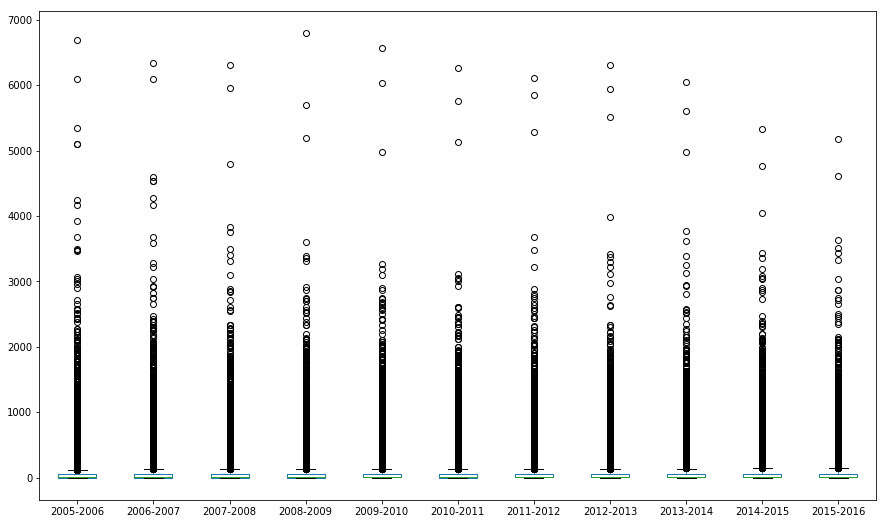

In [29]:
plt.show(CrimeStatistics[['2005-2006','2006-2007','2007-2008','2008-2009','2009-2010','2010-2011','2011-2012','2012-2013','2013-2014','2014-2015','2015-2016']].plot(kind='box'))

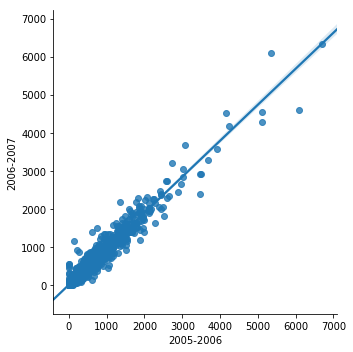

In [30]:
plt.show(sns.lmplot(x="2005-2006", y="2006-2007",data=CrimeStatistics))

In [16]:
CrimeStatistics.columns = ['Province','Station', 'Category',
              'First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year']

CrimeStatistics.head(5)

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030


### Duplication Check
#### These parts are used to check whether there are duplicated rows in the dataset, and it turns out there is no row like that, this dataset is a good one.

In [54]:
CrimeStatistics.duplicated()

0        False
1        False
2        False
3        False
4        False
5        False
6        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
         ...  
30831    False
30832    False
30833    False
30834    False
30835    False
30836    False
30837    False
30838    False
30839    False
30840    False
30841    False
30842    False
30843    False
30844    False
30845    False
30846    False
30847    False
30848    False
30849    False
30850    False
30851    False
30852    False
30853    False
30854    False
30855    False
30856    False
30857    False
30858    False
30859    False
30860    False
Length: 30861, dtype: bool

In [70]:
CrimeStatistics.drop_duplicates()

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030
5,North West,Rustenburg,All theft not mentioned elsewhere,4239,4173,3398,3388,2737,2117,2139,1914,1897,1868,1862
6,Kwazulu/Natal,Durban Central,All theft not mentioned elsewhere,4162,4529,3499,3353,3183,2933,3219,3418,3390,2872,2865
7,Gauteng,Brooklyn,All theft not mentioned elsewhere,3931,3583,2878,2568,2415,2162,2050,1883,2442,2200,2107
8,Gauteng,Booysens,All theft not mentioned elsewhere,3681,3277,2849,2603,2580,3107,2568,1339,1290,1039,943
9,Gauteng,Hillbrow,All theft not mentioned elsewhere,3489,2914,3093,2706,2250,2298,2051,1835,1610,1607,1618


In [71]:
CrimeStatistics.isnull()

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False
6,False,False,False,False,False,False,False,False,False,False,False,False,False,False
7,False,False,False,False,False,False,False,False,False,False,False,False,False,False
8,False,False,False,False,False,False,False,False,False,False,False,False,False,False
9,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [87]:
CrimeStatistics.describe().astype(np.int64).T

,count,mean,std,min,25%,50%,75%,max
First_year,30861,70,205,0,0,8,49,6692
Second_year,30861,69,198,0,0,8,50,6341
Third_year,30861,67,186,0,0,8,50,6316
Fourth_year,30861,68,187,0,0,9,52,6803
Fifth_year,30861,69,185,0,1,9,54,6571
Sixth_year,30861,67,181,0,0,9,52,6260
Seventh_year,30861,68,183,0,1,10,53,6108
Eighth_year,30861,69,184,0,1,10,55,6310
Ninth_year,30861,71,187,0,1,11,56,6044
Tenth_year,30861,71,185,0,1,11,57,5335


## The Range of Data

   * **I seperate data into 11 range to give them a grade according to the numbers of criminal cases of each year. This is the example of column, "Eleventh_year".**






In [94]:
bins = [0,1000,2000,3000,4000,5000,6000,7000]
group_names = ['A', 'B', 'C', 'D','E','F','G']
CrimeStatistics['categories'] =pd.cut(CrimeStatistics['Eleventh_year'], bins, labels=group_names)
CrimeStatistics

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year,categories
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176,F
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434,C
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635,D
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103,C
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030,D
5,North West,Rustenburg,All theft not mentioned elsewhere,4239,4173,3398,3388,2737,2117,2139,1914,1897,1868,1862,B
6,Kwazulu/Natal,Durban Central,All theft not mentioned elsewhere,4162,4529,3499,3353,3183,2933,3219,3418,3390,2872,2865,C
7,Gauteng,Brooklyn,All theft not mentioned elsewhere,3931,3583,2878,2568,2415,2162,2050,1883,2442,2200,2107,C
8,Gauteng,Booysens,All theft not mentioned elsewhere,3681,3277,2849,2603,2580,3107,2568,1339,1290,1039,943,A
9,Gauteng,Hillbrow,All theft not mentioned elsewhere,3489,2914,3093,2706,2250,2298,2051,1835,1610,1607,1618,B


## Plot each colmun as appropriate for the data type:

* ** Write a summary of what the plot tells you.**

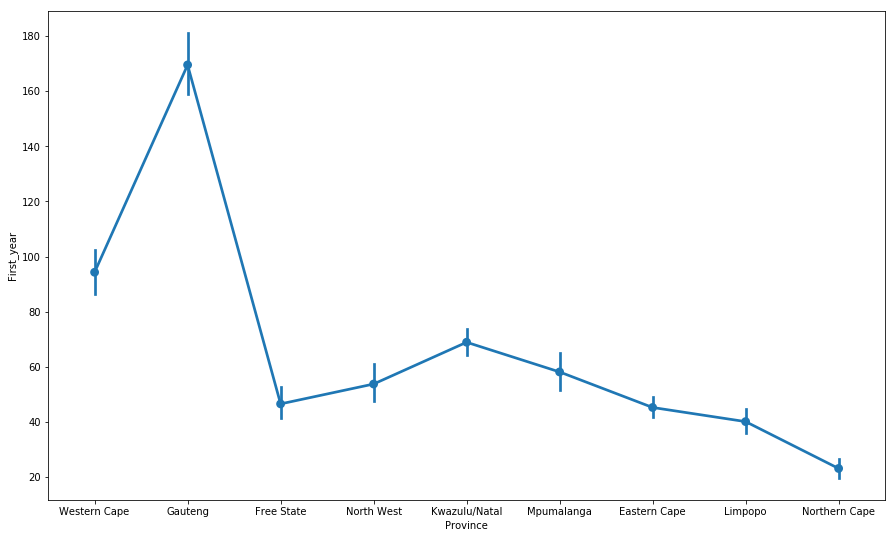

In [96]:
# This chart shows the trend of "First_year", it is obvious that the province: "Gauteng" has the most criminal cases.
sns.pointplot(x="Province", y="First_year", data=CrimeStatistics)


#### This chart shows the trend of "First_year", it is obvious that the province: "Gauteng" has the most criminal cases.

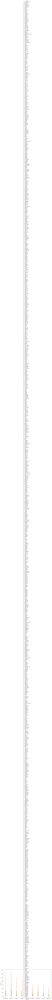

In [98]:
sns.pointplot(x="Province", y="First_year", hue="Station", data=CrimeStatistics)


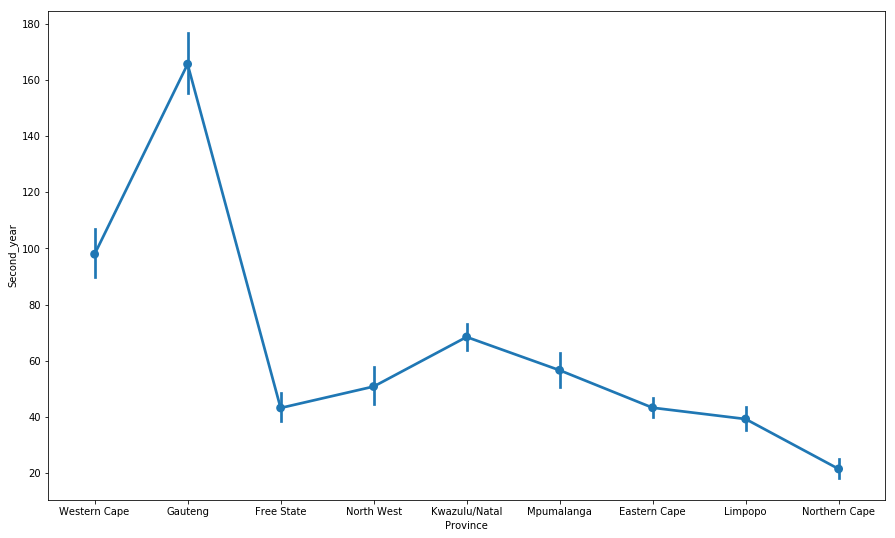

In [99]:
sns.pointplot(x="Province", y="Second_year", data=CrimeStatistics)


#### This chart shows the trend of "Second_year", it is obvious that the province: "Gauteng" has the most criminal cases.

## Are any of the columns correlated?
   This part explain the question:

               First_year  Second_year  Third_year  Fourth_year  Fifth_year  \
First_year       1.000000     0.981976    0.960028     0.939030    0.924656   
Second_year      0.981976     1.000000    0.980020     0.957898    0.941298   
Third_year       0.960028     0.980020    1.000000     0.981220    0.964241   
Fourth_year      0.939030     0.957898    0.981220     1.000000    0.980678   
Fifth_year       0.924656     0.941298    0.964241     0.980678    1.000000   
Sixth_year       0.908671     0.922965    0.944111     0.957882    0.979662   
Seventh_year     0.889163     0.903989    0.923750     0.933734    0.953716   
Eighth_year      0.863898     0.880364    0.899389     0.909448    0.931824   
Ninth_year       0.843423     0.858663    0.873831     0.881271    0.902247   
Tenth_year       0.829821     0.844077    0.857561     0.862292    0.883265   
Eleventh_year    0.826823     0.842471    0.854521     0.857659    0.880087   

               Sixth_year  Seventh_year  Eighth_yea

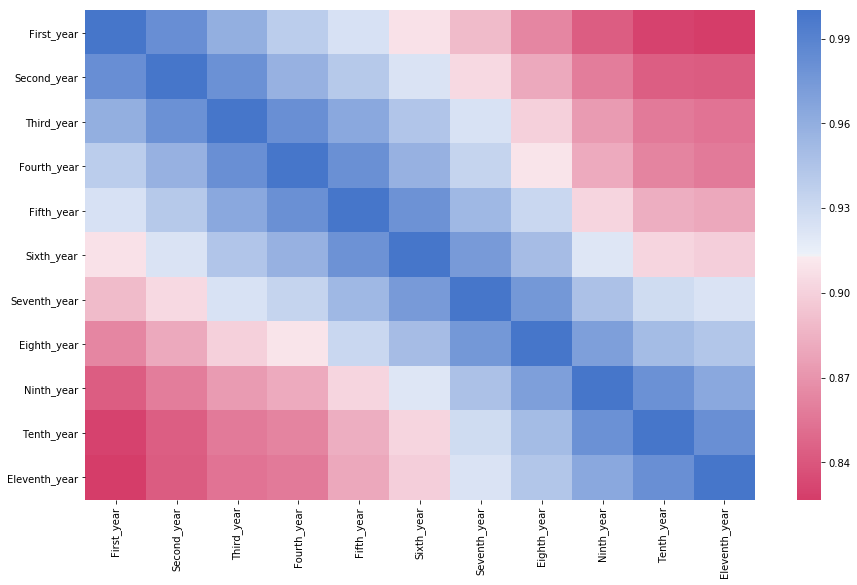

In [107]:
cmap = sns.diverging_palette(0, 255, sep=1, n=256, as_cmap=True)

correlations = CrimeStatistics[[ 'First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year']].corr()
print (correlations)
sns.heatmap(correlations, cmap=cmap)

In [112]:
CrimeStatistics.corr()

,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
First_year,1.000000,0.981976,0.960028,0.939030,0.924656,0.908671,0.889163,0.863898,0.843423,0.829821,0.826823
Second_year,0.981976,1.000000,0.980020,0.957898,0.941298,0.922965,0.903989,0.880364,0.858663,0.844077,0.842471
Third_year,0.960028,0.980020,1.000000,0.981220,0.964241,0.944111,0.923750,0.899389,0.873831,0.857561,0.854521
Fourth_year,0.939030,0.957898,0.981220,1.000000,0.980678,0.957882,0.933734,0.909448,0.881271,0.862292,0.857659
Fifth_year,0.924656,0.941298,0.964241,0.980678,1.000000,0.979662,0.953716,0.931824,0.902247,0.883265,0.880087
Sixth_year,0.908671,0.922965,0.944111,0.957882,0.979662,1.000000,0.973876,0.950320,0.921193,0.902039,0.899125
Seventh_year,0.889163,0.903989,0.923750,0.933734,0.953716,0.973876,1.000000,0.975682,0.946585,0.928651,0.923031
Eighth_year,0.863898,0.880364,0.899389,0.909448,0.931824,0.950320,0.975682,1.000000,0.970671,0.950830,0.943496
Ninth_year,0.843423,0.858663,0.873831,0.881271,0.902247,0.921193,0.946585,0.970671,1.000000,0.980360,0.964463
Tenth_year,0.829821,0.844077,0.857561,0.862292,0.883265,0.902039,0.928651,0.950830,0.980360,1.000000,0.981650


#### From the data and the chart above, we can see the numerical value of correlations are in the range of 0.80-1.00, so it turns out that the data in each columns are similar, and the general trend of these eleven years didn't fluctuated widely.

In [13]:
CrimeStatistics.isnull().sum()


Province         0
Station          0
Category         0
First_year       0
Second_year      0
Third_year       0
Fourth_year      0
Fifth_year       0
Sixth_year       0
Severth_year     0
Eighth_year      0
Ninth_year       0
Tenth_year       0
Eleventh_year    0
dtype: int64

In [14]:
(CrimeStatistics['First_year'] == 0).sum()


8867

In [15]:
CrimeStatistics.loc[CrimeStatistics['First_year'] < 5]


,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Severth_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
17196,Eastern Cape,Ntabankulu,Truck hijacking,4,0,0,0,0,0,0,0,0,0,0
17197,Free State,Arlington,Illegal possession of firearms and ammunition,4,0,0,0,0,0,0,0,0,0,0
17198,Eastern Cape,Baviaanskloof,Attempted murder,4,1,0,0,0,0,0,0,0,0,0
17199,Limpopo,Mankweng,Robbery of cash in transit,4,1,0,0,1,0,0,0,0,0,0
17200,Kwazulu/Natal,Donnybrook,Carjacking,4,0,0,1,4,0,0,0,0,0,0
17201,Eastern Cape,Bholo,Theft of motor vehicle and motorcycle,4,1,0,0,0,1,0,0,0,0,0
17202,North West,Phokeng,Truck hijacking,4,1,0,0,1,0,1,0,0,0,0
17203,Free State,Jacobsdal,Driving under the influence of alcohol or drugs,4,2,2,0,0,1,1,0,0,0,0
17204,Free State,Goedemoed,Attempted murder,4,1,0,1,0,0,1,1,0,0,0
17205,Free State,Dewetsdorp,Shoplifting,4,5,7,2,3,0,1,1,0,0,0


/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


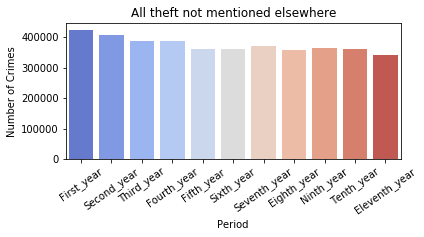

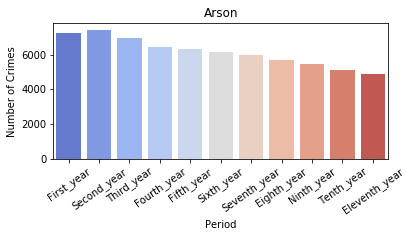

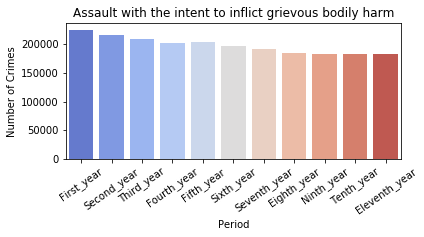

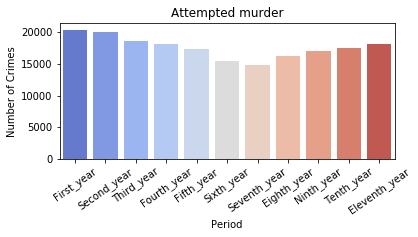

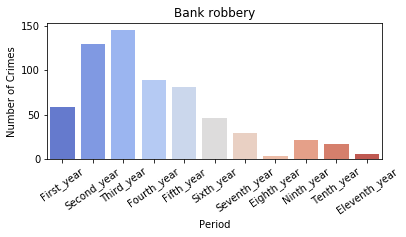

...

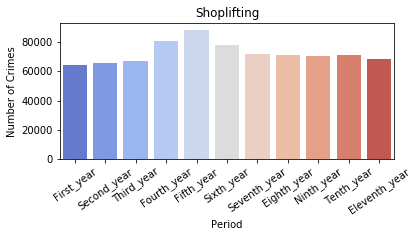

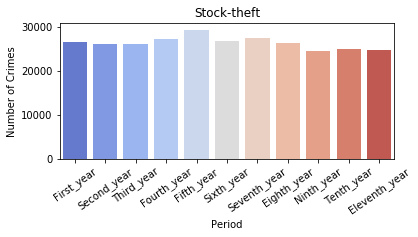

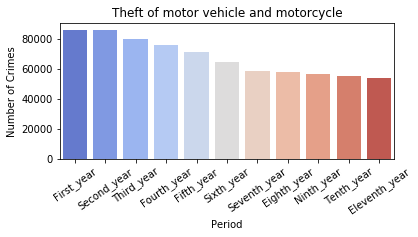

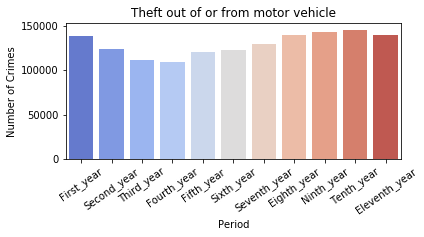

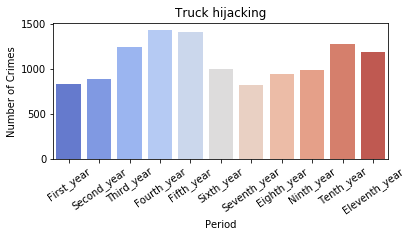

In [126]:
cols = Crimes_Category.transpose().columns
Crimes_Category_transpose = Crimes_Category.transpose()
Crimes_Category_transpose['index'] = Crimes_Category_transpose.index

n_rows=27
n_cols=1

for i in range(n_rows):
    fg,ax = plt.subplots(nrows=1,ncols=1,figsize=(6, 2.5))
    for j in range(n_cols):
        sns.barplot(Crimes_Category_transpose['index'], Crimes_Category_transpose[cols[i]],palette="coolwarm")
        ax.set_ylabel("Number of Crimes")
        ax.set_xlabel("Period")
        ax.set_xticklabels(Crimes_Category_transpose['index'],rotation=35)
        plt.title(cols[i*n_cols+j])


### As we can see:

* From the plots above, there are a lot categories of crimes, 'All theft not mentioned elsewhere','Arson','Assault with the intent to inflict grievous bodily harm','Common robbery', 'Malicious damage to property','Robbery of cash in transit','Sexual offences','Theft of motor vehicl and motorcycle', the trend of these categories are going down gradually.
* 'Bank robbery' is going up quickly and going down quickly, it may because the data lost, but more likely it is the result of strengthen in bank security. 
* 'Attempted murder' is going down and up.
* 'Burglary at non-residential premises' is going up gradually, it means the government should give more investment to manage the transient population and take appropriate measures to solve the problems.

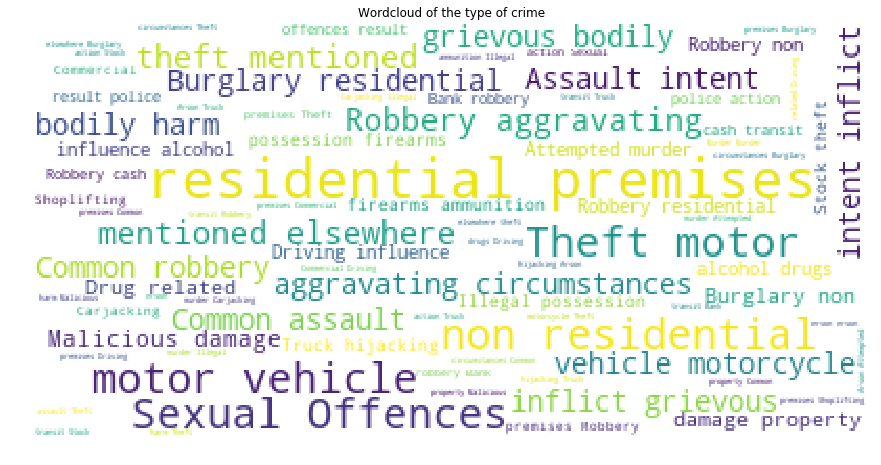

In [127]:
from wordcloud import WordCloud, STOPWORDS

def wordcloud_by_province(province):
    CrimeStatistics_new = CrimeStatistics[CrimeStatistics.Province == province]
    stopwords = set(STOPWORDS)
    stopwords.add("Total")
    stopwords.add("Crime")
    stopwords.add("Crimes")
    wordcloud = WordCloud(background_color="white",stopwords=stopwords,random_state = 0).generate(" ".join([i for i in CrimeStatistics_new['Category']]))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.title("Wordcloud of the type of crime")

wordcloud_by_province('Gauteng') 

#### From the word cloud, the visual representation of data shows the frequency of all the types of crime in Province 'Gauteng'.

/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3296: MatplotlibDeprecationWarning: The ishold function was deprecated in version 2.0.
  b = ax.ishold()
/anaconda3/lib/python3.6/site-packages/mpl_toolkits/basemap/__init__.py:3305: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  ax.hold(b)


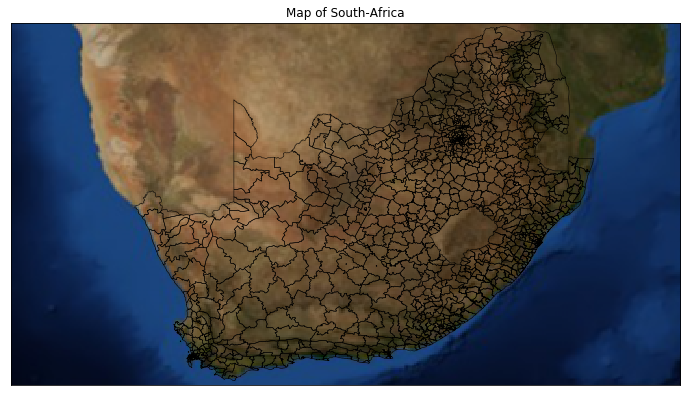

In [128]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import shapefile as shp  

plt.figure(figsize=(12,12))
map = Basemap(resolution='i',llcrnrlon=12,llcrnrlat=-35,urcrnrlat=-22,urcrnrlon=36,lat_0=-40,lon_0=0,)

#map.drawmapboundary(fill_color='aqua')
#map.fillcontinents(color='#ddaa66',lake_color='blue')
#map.drawcoastlines()
map.readshapefile('/Users/yitong/Desktop/7390/Police_bounds','Police_bounds')
map.bluemarble()

plt.title("Map of South-Africa")
plt.show()

## Assignment 2
**_Yitong Liu,  NUID:  001822175_**

#### Cluster your data:
Use at least two methods to cluster your data. (25 points)
Answer the following questions for the clustering:
* Do the clustering methods generate the same clusters?
* Does scaling effect the clustering?  
* Does the clustering produce interesting groupings?  

#### Generate a linear model for your data:
Find a significant linear relation of your choosing in your data. Create a multivariate linear model. (50 points)
Answer the following questions for the multivariate linear model:
* Is the relationship significant?   
* Are any model assumptions violated?   
* Is there any multi-colinearity in the model?   
* In the multiple regression models are predictor variables independent of all the other predictor variables?   
* In in multiple regression models rank the most significant predictor variables and exclude insignificant ones from the model.   
* Does the model make sense?  
* Cross-validate the model. How well did it do?      
* Does regularization help with creating models that validate better on out of sample data?   

#### Generate a logistic model for your data:
Find a significant logistic linear model of your choosing in your data. Create a logistic linear model. (25 points)
Answer the following questions for the logistic linear model:
* Is the relationship significant?  
* Are any model assumptions violated?   
* Cross-validate the model. How well did it do?  

#### Part 1

#### Cluster your data:
Use at least two methods to cluster your data. (25 points)
Answer the following questions for the clustering:
* Do the clustering methods generate the same clusters?
* Does scaling effect the clustering?  
* Does the clustering produce interesting groupings?

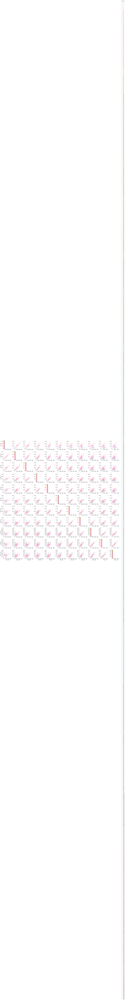

In [4]:
sns.pairplot(CrimeStatistics, hue="First_year")
plt.show()

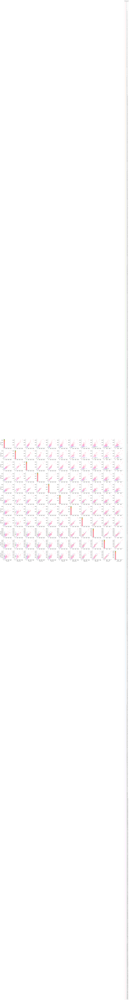

In [5]:
sns.pairplot(CrimeStatistics, hue="Second_year")
plt.show()

In [7]:
pd.scatter_matrix(CrimeStatistics[['First_year', 'Second_year','Third_year']], alpha=0.5, figsize=(9, 6), diagonal='kde')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: pandas.scatter_matrix is deprecated. Use pandas.plotting.scatter_matrix instead
  """Entry point for launching an IPython kernel.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a43814cc0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x1a7436db00>]], dtype=object)

In [27]:
# Fit a k-means estimator
estimator = KMeans(n_clusters=3)
X = iris[["sepal_length", "petal_length"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print Counter(labels)

colors = set_colors(labels)
plt.scatter(iris["petal_length"], iris["sepal_length"], c=colors)
plt.xlabel("petal_length")
plt.ylabel("sepal_length")
plt.show()

SyntaxError: invalid syntax (<ipython-input-27-42373acf2a52>, line 7)

In [31]:
# Fit a k-means estimator
estimator = KMeans(n_clusters=3)
X = CrimeStatistics[["Tenth_Year", "Eleventh_Year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["Tenth_Year"], CrimeStatistics["Eleventh_Year"], c=colors)
plt.xlabel("Tenth_Year")
plt.ylabel("Eleventh_Year")
plt.show()

NameError: name 'KMeans' is not defined

In [1]:
%matplotlib inline
from collections import Counter
import random

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from scipy.stats import multivariate_normal

Counter({0: 28198, 2: 2388, 1: 275})


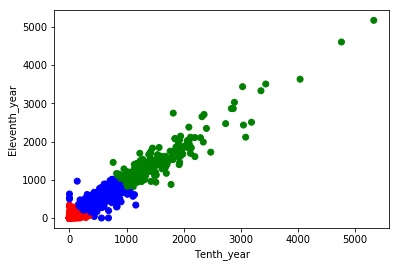

In [62]:
# Fit a k-means estimator
estimator = KMeans(n_clusters=3)
X = CrimeStatistics[["Tenth_year", "Eleventh_year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["Tenth_year"], CrimeStatistics["Eleventh_year"], c=colors)
plt.xlabel("Tenth_year")
plt.ylabel("Eleventh_year")
plt.show()

In [39]:
def set_colors(labels, colors='rgbykcmw'):
    colored_labels = []
    for label in labels:
        if (label < 0) or (label > 6):
          colored_labels.append(colors[7]) 
        else:
          colored_labels.append(colors[label])
    return colored_labels




Counter({0: 28197, 2: 2389, 1: 275})


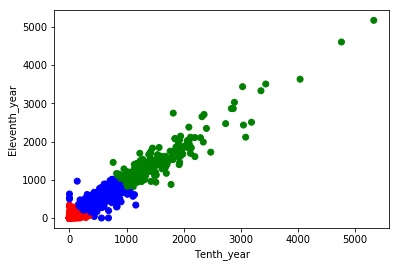

In [36]:
# Fit a k-means estimator
estimator = KMeans(n_clusters=3)
X = CrimeStatistics[["Tenth_year", "Eleventh_year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["Tenth_year"], CrimeStatistics["Eleventh_year"], c=colors)
plt.xlabel("Tenth_year")
plt.ylabel("Eleventh_year")
plt.show()

In [56]:

print(labels[0])
a=(len(labels)*0.5)
print(int(a))
print(labels[-1]) 

2
15430
0


In [67]:
label_map = {"setosa": 1, "versicolor": 0, "First_year": 2}

true_labels = []
for row in CrimeStatistics.itertuples():
    true_labels.append(label_map[row.species])

number_correct = 0
for t, l in zip(true_labels, labels):
    if t == l:
        number_correct += 1
print(number_correct / float(len(CrimeStatistics))) 

AttributeError: 'Pandas' object has no attribute 'species'

In [143]:

# Fit a DBSCAN estimator
estimator = DBSCAN(eps=0.85, min_samples=10)
X = CrimeStatistics_circ[["x", "y"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
# print labels
print(Counter(labels))

NameError: name 'CrimeStatistics_circ' is not defined

In [71]:

def annulus(inner_radius, outer_radius, n=30, color='b'):
    """Generate n points with class `color` between the inner radius and the outer radius."""
    data = []
    diff = outer_radius - inner_radius
    for _ in range(n):
        # Pick an angle and radius
        angle = 2 * np.pi * random.random()
        r = inner_radius + diff * random.random()
        x = r * np.cos(angle)
        y = r * np.sin(angle)
        data.append((x, y))
    # Return a data frame for convenience
    xs, ys = zip(*data)
    df = pd.DataFrame()
    df["x"] = xs
    df["y"] = ys
    df["color"] = color
    return df

df1 = annulus(2, 6, 200, color='r')
df2 = annulus(8, 10, 300, color='g')
df_circ = pd.concat([df1, df2])

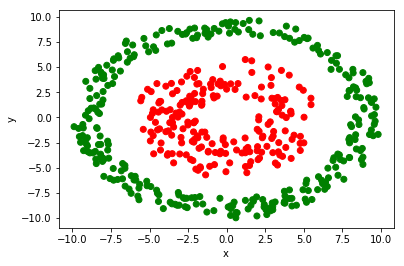

In [72]:
plt.scatter(df_circ['x'], df_circ['y'], c=df_circ['color'])
plt.xlabel("x")
plt.ylabel("y")
plt.show()

In [73]:
# Fit a DBSCAN estimator
estimator = DBSCAN(eps=0.85, min_samples=10)
X = df_circ[["x", "y"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
# print labels
print(Counter(labels))

Counter({-1: 392, 4: 22, 2: 20, 3: 16, 6: 14, 0: 13, 1: 12, 5: 11})


Counter({-1: 392, 4: 22, 2: 20, 3: 16, 6: 14, 0: 13, 1: 12, 5: 11})


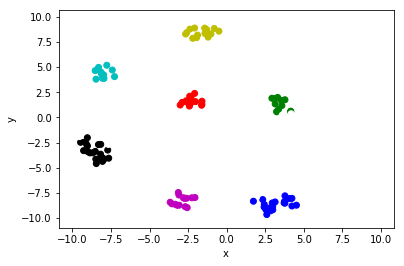

In [75]:
# Fit a DBSCAN estimator
estimator = DBSCAN(eps=0.85, min_samples=10)
X = df_circ[["x", "y"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
# print labels
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(df_circ['x'], df_circ['y'], c=colors)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

Counter({-1: 419, 2: 21, 5: 15, 4: 13, 0: 12, 1: 10, 3: 10})


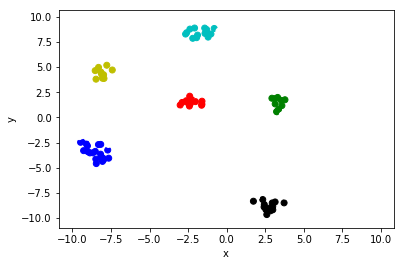

In [77]:
# Fit a DBSCAN estimator
estimator = DBSCAN(eps=0.8, min_samples=10)
X = df_circ[["x", "y"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(df_circ['x'], df_circ['y'], c=colors)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

/anaconda3/lib/python3.6/site-packages/scipy/stats/_multivariate.py:535: RuntimeWarning: covariance is not positive-semidefinite.
  out = random_state.multivariate_normal(mean, cov, size)


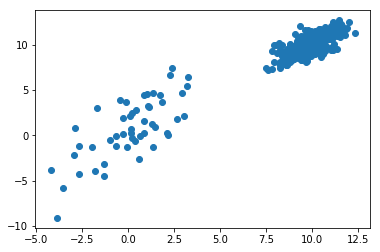

In [80]:
## Create some synthetic data

data = []
dist = multivariate_normal(mean=[0,0], cov=[[6,12],[1,6]])
for i in range(50):
    data.append(dist.rvs())
dist = multivariate_normal(mean=[10,10], cov=[[1,1.1],[0.2,0.6]])
for i in range(400):
    data.append(dist.rvs())    
    
df2 = pd.DataFrame(data, columns=["x", "y"])
df2.head()
plt.scatter(df2['x'], df2['y'])
plt.show()

Counter({1: 400, 0: 37, -1: 13})


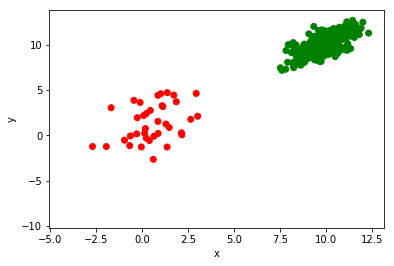

In [82]:
# Fit a DBSCAN estimator
estimator = DBSCAN(eps=2, min_samples=10)
X = df2[["x", "y"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(df2['x'], df2['y'], c=colors)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

Counter({-1: 13478, 268: 5453, 148: 828, 223: 790, 275: 460, 261: 300, 192: 298, 269: 295, 279: 270, 233: 232, 93: 177, 262: 174, 105: 156, 224: 155, 35: 144, 293: 136, 120: 131, 235: 113, 280: 110, 296: 107, 173: 99, 256: 98, 211: 93, 242: 87, 283: 87, 270: 82, 257: 78, 250: 77, 174: 73, 286: 72, 300: 72, 142: 71, 162: 70, 237: 69, 182: 68, 230: 67, 290: 63, 243: 62, 203: 59, 21: 58, 79: 57, 219: 57, 131: 56, 232: 56, 137: 53, 149: 53, 167: 53, 132: 52, 297: 48, 155: 47, 194: 47, 212: 47, 281: 47, 34: 45, 271: 45, 272: 45, 284: 45, 263: 44, 109: 43, 139: 43, 70: 40, 138: 40, 291: 40, 53: 39, 154: 39, 11: 38, 169: 38, 247: 38, 156: 37, 217: 37, 251: 37, 264: 36, 288: 36, 13: 34, 54: 34, 56: 34, 113: 34, 273: 34, 37: 33, 122: 33, 245: 33, 76: 32, 153: 32, 158: 32, 166: 32, 26: 31, 72: 31, 225: 31, 274: 31, 45: 30, 238: 30, 100: 29, 143: 29, 213: 29, 23: 28, 126: 28, 165: 28, 198: 28, 205: 28, 277: 28, 2: 27, 127: 27, 258: 27, 25: 26, 81: 26, 101: 26, 114: 26, 130: 26, 164: 25, 186: 25, 

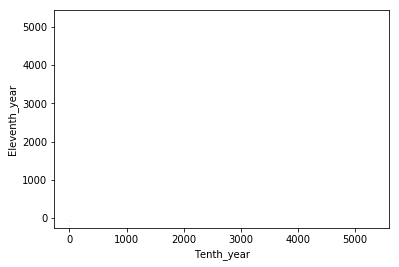

In [85]:

# Fit a DBSCAN
estimator = DBSCAN(eps=0.5, min_samples=10)
X = CrimeStatistics[["Tenth_year", "Eleventh_year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print (Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["Tenth_year"], CrimeStatistics["Eleventh_year"], c=colors)
plt.xlabel("Tenth_year")
plt.ylabel("Eleventh_year")
plt.show()

Counter({-1: 13478, 268: 5453, 148: 828, 223: 790, 275: 460, 261: 300, 192: 298, 269: 295, 279: 270, 233: 232, 93: 177, 262: 174, 105: 156, 224: 155, 35: 144, 293: 136, 120: 131, 235: 113, 280: 110, 296: 107, 173: 99, 256: 98, 211: 93, 242: 87, 283: 87, 270: 82, 257: 78, 250: 77, 174: 73, 286: 72, 300: 72, 142: 71, 162: 70, 237: 69, 182: 68, 230: 67, 290: 63, 243: 62, 203: 59, 21: 58, 79: 57, 219: 57, 131: 56, 232: 56, 137: 53, 149: 53, 167: 53, 132: 52, 297: 48, 155: 47, 194: 47, 212: 47, 281: 47, 34: 45, 271: 45, 272: 45, 284: 45, 263: 44, 109: 43, 139: 43, 70: 40, 138: 40, 291: 40, 53: 39, 154: 39, 11: 38, 169: 38, 247: 38, 156: 37, 217: 37, 251: 37, 264: 36, 288: 36, 13: 34, 54: 34, 56: 34, 113: 34, 273: 34, 37: 33, 122: 33, 245: 33, 76: 32, 153: 32, 158: 32, 166: 32, 26: 31, 72: 31, 225: 31, 274: 31, 45: 30, 238: 30, 100: 29, 143: 29, 213: 29, 23: 28, 126: 28, 165: 28, 198: 28, 205: 28, 277: 28, 2: 27, 127: 27, 258: 27, 25: 26, 81: 26, 101: 26, 114: 26, 130: 26, 164: 25, 186: 25, 

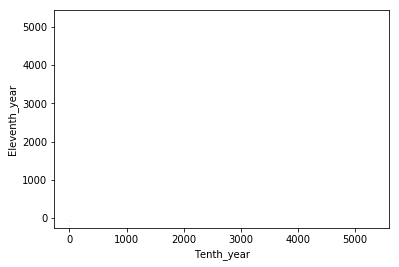

In [86]:
# Fit a DBSCAN
estimator = DBSCAN(eps=0.8, min_samples=10)
X = CrimeStatistics[["Tenth_year", "Eleventh_year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print (Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["Tenth_year"], CrimeStatistics["Eleventh_year"], c=colors)
plt.xlabel("Tenth_year")
plt.ylabel("Eleventh_year")
plt.show()

In [91]:
# Hierarchical: Agglomerative Clustering
from sklearn.cluster import AgglomerativeClustering

# Fit an estimator
estimator = AgglomerativeClustering(n_clusters=4)
X = rc[["x", "y"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(rc['x'], rc['y'], c=colors)
plt.xlabel("x")
plt.ylabel("y")
plt.show()

NameError: name 'rc' is not defined

Counter({0: 25682, 3: 3693, 1: 1146, 4: 296, 2: 44})


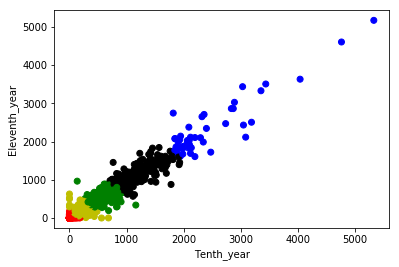

In [43]:
# Fit a k-means estimator
estimator = KMeans(n_clusters=5)
X = CrimeStatistics[["Tenth_year", "Eleventh_year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["Tenth_year"], CrimeStatistics["Eleventh_year"], c=colors)
plt.xlabel("Tenth_year")
plt.ylabel("Eleventh_year")
plt.show()

Counter({0: 23138, 3: 4489, 7: 1786, 4: 856, 1: 401, 5: 145, 2: 40, 6: 6})


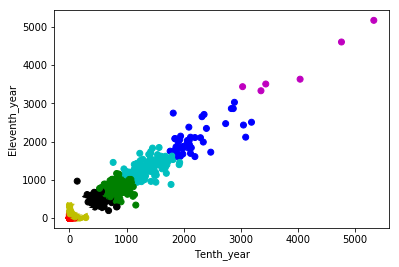

In [44]:
# Fit a k-means estimator
estimator = KMeans(n_clusters=8)
X = CrimeStatistics[["Tenth_year", "Eleventh_year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["Tenth_year"], CrimeStatistics["Eleventh_year"], c=colors)
plt.xlabel("Tenth_year")
plt.ylabel("Eleventh_year")
plt.show()

Counter({0: 24992, 6: 3647, 3: 1387, 1: 605, 5: 171, 4: 51, 2: 8})


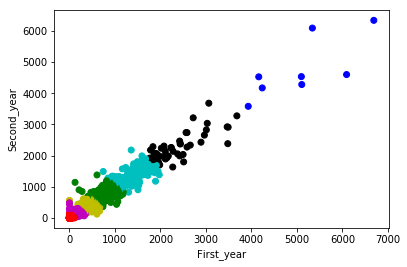

In [45]:
# Fit a k-means estimator
estimator = KMeans(n_clusters=7)
X = CrimeStatistics[["First_year", "Second_year"]]
estimator.fit(X)
# Clusters are given in the labels_ attribute
labels = estimator.labels_
print(Counter(labels))

colors = set_colors(labels)
plt.scatter(CrimeStatistics["First_year"], CrimeStatistics["Second_year"], c=colors)
plt.xlabel("First_year")
plt.ylabel("Second_year")
plt.show()

#### Part2

#### Generate a linear model for your data:
Find a significant linear relation of your choosing in your data. Create a multivariate linear model. (50 points)
Answer the following questions for the multivariate linear model:
* Is the relationship significant?   
* Are any model assumptions violated?   
* Is there any multi-colinearity in the model?   
* In the multiple regression models are predictor variables independent of all the other predictor variables?   
* In in multiple regression models rank the most significant predictor variables and exclude insignificant ones from the model.   
* Does the model make sense?  
* Cross-validate the model. How well did it do?      
* Does regularization help with creating models that validate better on out of sample data? 

#### Multivariate linear model

In [2]:
from __future__ import print_function
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
import statsmodels.api as sm
from sklearn import linear_model
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import warnings
warnings.filterwarnings('ignore')

/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [3]:
# Load the data into a pandas dataframe
df = pd.read_csv('CrimeStatistics.csv')
df.head()

,Province,Station,Category,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030


In [95]:
df.describe()

,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
count,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000
mean,70.527753,69.301610,67.154305,68.756165,69.517773,67.766696,68.259616,69.700658,71.416999,71.498202,70.736496
std,205.491698,198.037635,186.760510,187.173860,185.514638,181.865878,183.334468,184.812420,187.635207,185.019046,179.363964
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,8.000000,8.000000,8.000000,9.000000,9.000000,9.000000,10.000000,10.000000,11.000000,11.000000,11.000000
75%,49.000000,50.000000,50.000000,52.000000,54.000000,52.000000,53.000000,55.000000,56.000000,57.000000,58.000000
max,6692.000000,6341.000000,6316.000000,6803.000000,6571.000000,6260.000000,6108.000000,6310.000000,6044.000000,5335.000000,5176.000000


AttributeError: module 'seaborn' has no attribute 'plt'

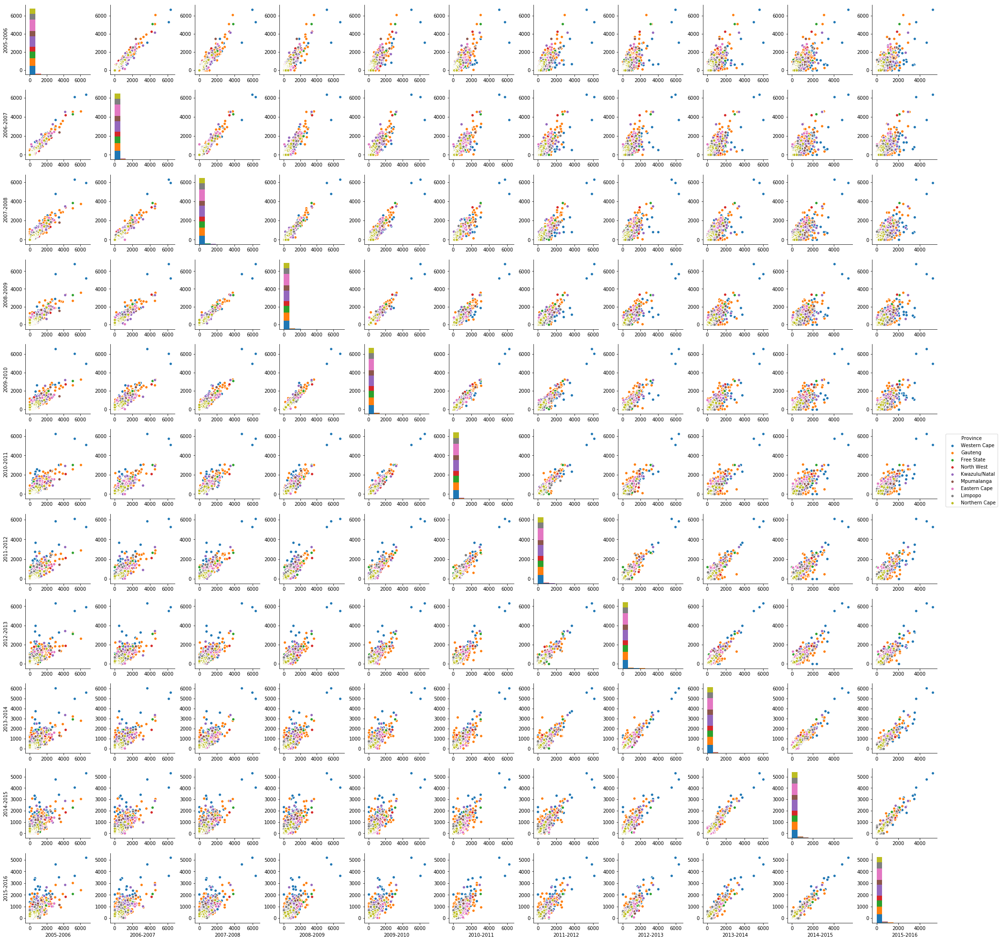

In [99]:

# Quick plot of the data using seaborn
sns.pairplot(df, hue="Province")
sns.plt.show()

AttributeError: module 'seaborn' has no attribute 'plt'

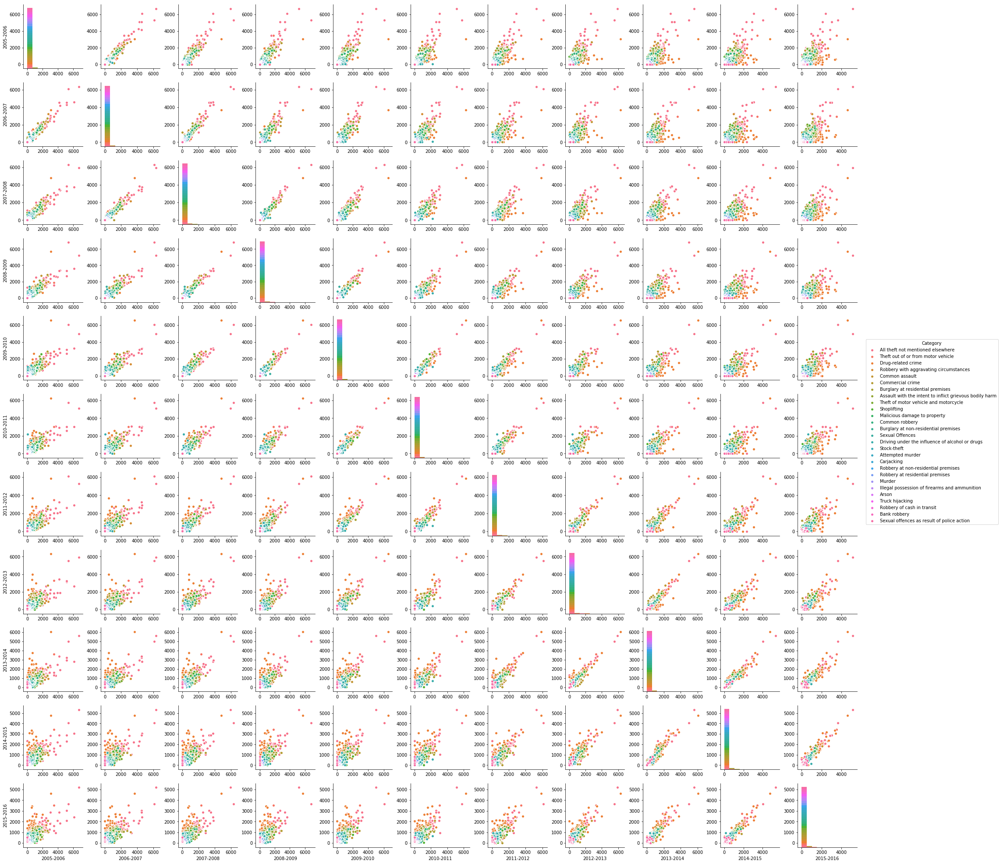

In [100]:

# Quick plot of the data using seaborn
sns.pairplot(df, hue="Category")
sns.plt.show()

In [ ]:
def find_cluster_centers(matrix, k=4):
    k_means = KMeans(n_clusters=k)
    k_means.fit(matrix)
    return k_means.cluster_centers_

In [119]:
# change the name for each column.
CrimeStatistics.columns = ['Province','Station', 'Category',
              'First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year']

CrimeStatistics.head(8)

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030
5,North West,Rustenburg,All theft not mentioned elsewhere,4239,4173,3398,3388,2737,2117,2139,1914,1897,1868,1862
6,Kwazulu/Natal,Durban Central,All theft not mentioned elsewhere,4162,4529,3499,3353,3183,2933,3219,3418,3390,2872,2865
7,Gauteng,Brooklyn,All theft not mentioned elsewhere,3931,3583,2878,2568,2415,2162,2050,1883,2442,2200,2107


AttributeError: module 'seaborn' has no attribute 'plt'

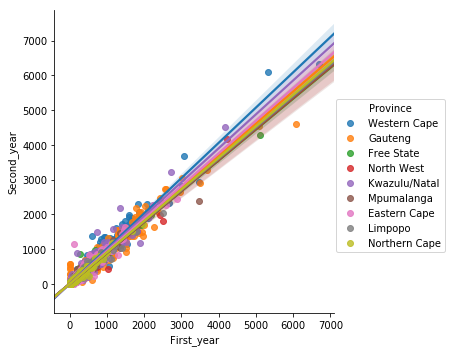

In [132]:
sns.lmplot(x="First_year", y="Second_year", data=CrimeStatistics,  hue="Province")
sns.plt.show()

#### now we get the value for a and b, y= ax+b,

In [134]:


# from sklearn import linear_model

X = CrimeStatistics[["First_year"]]
y = CrimeStatistics[["Second_year"]]

# Fit the linear model
model = linear_model.LinearRegression()
results = model.fit(X, y)

# Print the coefficients
print (results.intercept_, results.coef_)

[ 2.5573086] [[ 0.94635514]]



This means that our best fit line is: $$y = a + b x$$

Which translates in to the equations below:

$$ second_{year} = 2.56 + 0.95 First_{year} + \varepsilon $$

#### Next let's use statsmodels.

In [135]:
# import statsmodels.api as sm
# Note the swap of X and y
model = sm.OLS(y, X)
results = model.fit()
# Statsmodels gives R-like statistical output
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Second_year   R-squared:                       0.968
Model:                            OLS   Adj. R-squared:                  0.968
Method:                 Least Squares   F-statistic:                 9.347e+05
Date:                Thu, 15 Feb 2018   Prob (F-statistic):               0.00
Time:                        18:48:25   Log-Likelihood:            -1.5565e+05
No. Observations:               30861   AIC:                         3.113e+05
Df Residuals:                   30860   BIC:                         3.113e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
First_year     0.9502      0.001    966.821      0.000       0.948       0.952
==============================================================================
Omnibus:                    23225.931   Durbin-Watson:                   2.103
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         33205780.078
Skew:                           2.194   Prob(JB):                         0.00
Kurtosis:                     163.637   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

#### Is the relationship significant?

  ** Result from above **The coefficient for math is significantly different from 0 because both p-values are 0.000, which are smaller than 0.05. The result state that the coefficients has a very small possibility to be 0.
   
  
  

In [136]:

print('Parameters: ', results.params)
print('R2: ', results.rsquared)

Parameters:  First_year    0.950176
dtype: float64
R2:  0.968040714494


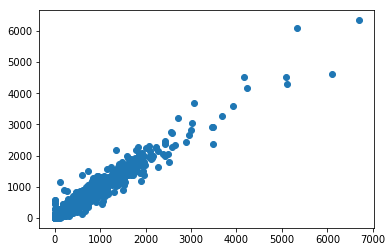

In [138]:
X = CrimeStatistics[["First_year"]]
y = CrimeStatistics[["Second_year"]]
plt.plot(X, y, "o")

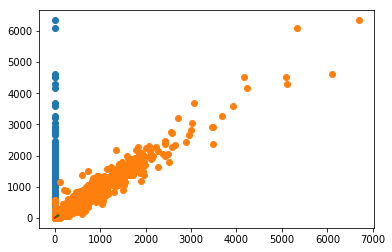

In [140]:

X = sm.add_constant(X) #  Our model needs an intercept so we add a column of 1s:
plt.plot(X, y, "o")
x2 = np.linspace(0, 80, 55)
y2 = 2.56 + (0.95*x2)
plt.plot(x2, y2, lw=2, color="r")
x2 = np.linspace(55, 80, 33)
y2 = (0.950176*x2)
plt.plot(x2, y2, lw=2, color="g")
plt.show()

In [141]:

model = sm.OLS(y, X)
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            Second_year   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.964
Method:                 Least Squares   F-statistic:                 8.330e+05
Date:                Thu, 15 Feb 2018   Prob (F-statistic):               0.00
Time:                        18:54:35   Log-Likelihood:            -1.5558e+05
No. Observations:               30861   AIC:                         3.112e+05
Df Residuals:                   30859   BIC:                         3.112e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.5573      0.225     11.352      0.000       2.116       2.999
First_year     0.9464      0.001    912.666      0.000       0.944       0.948
==============================================================================
Omnibus:                    24934.323   Durbin-Watson:                   2.111
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         32824122.019
Skew:                           2.546   Prob(JB):                         0.00
Kurtosis:                     162.690   Cond. No.                         230.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [142]:

print('Parameters: ', results.params)
print('R2: ', results.rsquared)

Parameters:  const         2.557309
First_year    0.946355
dtype: float64
R2:  0.96427606467


#### Are any model assumptions violated?

Usually there are 4 assumptions for a model:  
  
① The Y-value(or the errors,"e") are independent  
② The Y-values can be expressed as a linear function of X variable  
③ Variation of observations around the regression line(the residual SE) is constant  
④ For given value of X,Y values (or the error) are Normally distributed  

The first assumptions base on the knowledge of study design or data collection  
The left 3 assumptions could be check by examinin the residuals or errors.

#### Is there any multi-colinearity in the model?   

#### In the multivariate models are predictor variables independent of all the other predictor variables?


#### In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

①One possibility is to measure the importance of a variable by the magnitude of its regression coefficient. This approach fails because the regression coefficients depend on the underlying scale of measurements. 
  
**First_year**, **Second_year** have same scales.

②Another possibility is to measure the importance of a variable by its observed significance level (P value). However, the distinction between statistical significant and practical importance applies here, too. Even if the predictors are measured on the same scale, a small coefficient that can be estimated precisely will have a small P value, while a large coefficient that is not estimate precisely will have a large P value.

#### Does the model make sense?



#### Does regularization help? 

Regularization is a method for reducing overfitting. We assess whether the regularization help by comparing the rmes value before and after Using ridge and lasso.

In [69]:
from sklearn import metrics


In [72]:
predictors = ['First_year','Second_year','Third_year']

X = sm.add_constant(CrimeStatistics[predictors])
y_mean = np.mean(CrimeStatistics['Fourth_year'])
model = sm.OLS(CrimeStatistics['Fourth_year'], X)
y_mean


68.75616473866693

In [73]:
ols_fit = model.fit()
y_pred = ols_fit.predict(X)
rmes_ols = np.sqrt(metrics.mean_squared_error(CrimeStatistics['Fourth_year'],y_pred))
rmes_ols


35.922813193782943

In [74]:
rmes_ols/y_mean


0.52246679741839586

In [75]:
lasso_fit = model.fit_regularized(L1_wt=1,alpha = 0.05)
lasso_pred = lasso_fit.predict(X)
rmes_lasso = np.sqrt(metrics.mean_squared_error(CrimeStatistics['Fourth_year'],lasso_pred))
rmes_lasso

37.030602061094648

In [76]:
rmes_lasso/y_mean

0.53857864530174215

In [77]:
ridge_fit = model.fit_regularized(L1_wt=0,alpha = 0.05)
ridge_pred = ridge_fit.predict(X)
rmes_ridge = np.sqrt(metrics.mean_squared_error(CrimeStatistics['Fourth_year'],ridge_pred))
rmes_ridge

35.923064117368988

In [78]:
rmes_ridge/y_mean


0.52247044688876698

### The Thire_year & Second_year

AttributeError: module 'seaborn' has no attribute 'plt'

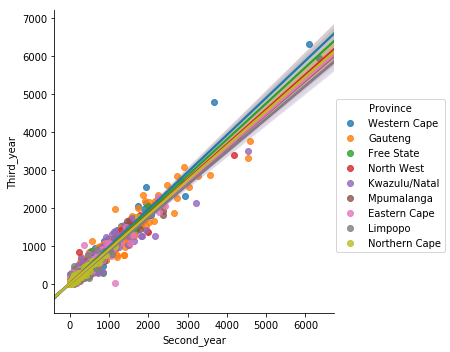

In [126]:
sns.lmplot(y="Third_year", x="Second_year", data=CrimeStatistics,  hue="Province")
sns.plt.show()

In [128]:

# from sklearn import linear_model

X = CrimeStatistics[["Third_year"]]
y = CrimeStatistics[["Second_year"]]

# Fit the linear model
model = linear_model.LinearRegression()
results = model.fit(X, y)

# Print the coefficients
print (results.intercept_, results.coef_)

[-0.48492935] [[ 1.03919682]]


#### Part 3

#### Generate a logistic model for your data:
Find a significant logistic linear model of your choosing in your data. Create a logistic linear model. (25 points)
Answer the following questions for the logistic linear model:
* Is the relationship significant?  
* Are any model assumptions violated?   
* Cross-validate the model. How well did it do?  

In [3]:
%matplotlib inline 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import warnings
import random
from sklearn.cross_validation import KFold, cross_val_score, train_test_split
from sklearn import metrics
import statsmodels.api as sm
import scipy.stats as stats 
from sklearn.linear_model import LogisticRegression

from datetime import datetime
random.seed(datetime.now())
warnings.filterwarnings('ignore')





## read the data from csv
CrimeStatistics = pd.read_csv('CrimeStatistics.csv', header=0)
## show the data samples of first 10 lines
CrimeStatistics.head(10)
plt.rcParams['figure.figsize'] = (15, 9)

/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [7]:
## show the data samples of first 10 lines
df.head()

,Province,Station,Category,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030


In [64]:
# change the name for each column.
CrimeStatistics.columns = ['Province','Station', 'Category',
              'First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year']

CrimeStatistics.head(5)

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030


#### logistic linear model


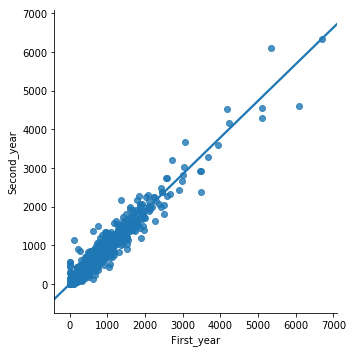

In [65]:
sns.lmplot(x='First_year', y='Second_year', data=CrimeStatistics, ci=None)


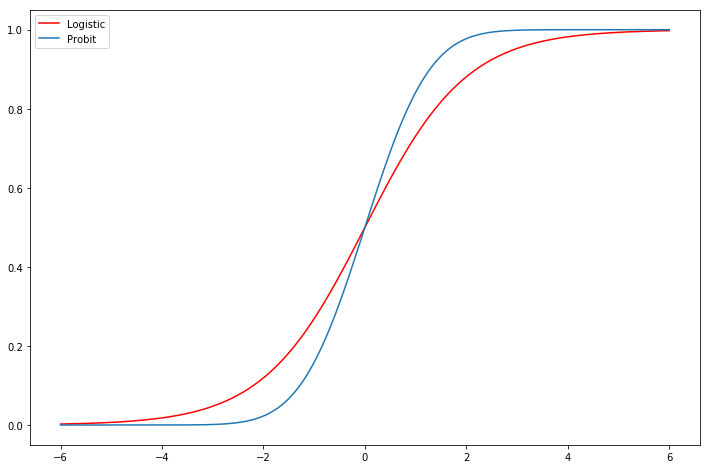

In [66]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
support = np.linspace(-6, 6, 1000)
ax.plot(support, stats.logistic.cdf(support), 'r-', label='Logistic')
ax.plot(support, stats.norm.cdf(support), label='Probit')
ax.legend();

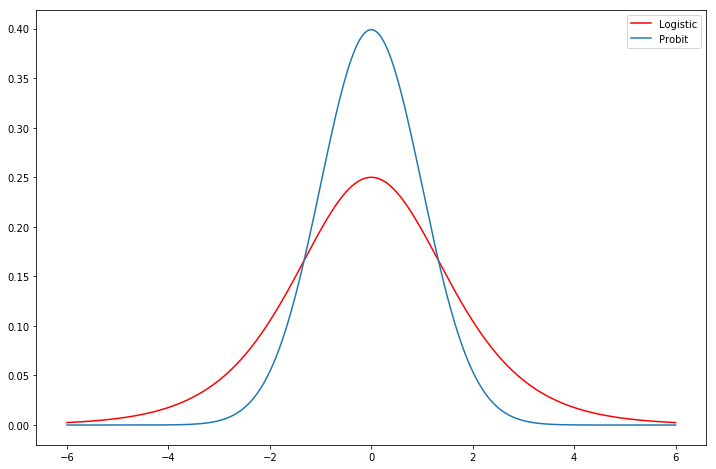

In [67]:
fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111)
support = np.linspace(-6, 6, 1000)
ax.plot(support, stats.logistic.pdf(support), 'r-', label='Logistic')
ax.plot(support, stats.norm.pdf(support), label='Probit')
ax.legend();

## Is the relationship significant?

by seeing the summary of the logistic model


In [81]:
predictors = ['First_year','Second_year']
model1 = sm.Logit(CrimeStatistics['Third_year'],CrimeStatistics[predictors]).fit()
model1.summary()

ValueError: endog must be in the unit interval.

In [79]:
CrimeStatistics_model = sm.Logit(CrimeStatistics['First_year'], CrimeStatistics['Second_year']).fit()
CrimeStatistics_model.summary()


ValueError: endog must be in the unit interval.

In [14]:

# Adding intercept manually
CrimeStatistics['intercept'] = 1.0
CrimeStatistics.head()

,Province,Station,Category,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year,intercept
0,Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176,1.0
1,Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434,1.0
2,Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635,1.0
3,Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103,1.0
4,Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030,1.0


In [15]:
pred=['First_year','intercept']
pred


['First_year', 'intercept']

##### Confidence Interval


In [18]:
CrimeStatistics_model.conf_int()


NameError: name 'CrimeStatistics_model' is not defined

##### Dummy Variable

In [28]:

dummy_ranks = pd.get_dummies(CrimeStatistics['First_year'], prefix='Category')
dummy_ranks.head(10)

,Category_0,Category_1,Category_2,Category_3,Category_4,Category_5,Category_6,Category_7,Category_8,Category_9,...,Category_3489,Category_3681,Category_3931,Category_4162,Category_4239,Category_5099,Category_5108,Category_5341,Category_6093,Category_6692
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [29]:
dummy_ranks = pd.get_dummies(CrimeStatistics['First_year'], prefix='Province')
dummy_ranks.head(10)

,Province_0,Province_1,Province_2,Province_3,Province_4,Province_5,Province_6,Province_7,Province_8,Province_9,...,Province_3489,Province_3681,Province_3931,Province_4162,Province_4239,Province_5099,Province_5108,Province_5341,Province_6093,Province_6692
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [34]:
dummy_ranks = pd.get_dummies(CrimeStatistics['Second_year'], prefix='Province')
dummy_ranks.head(10)

,Province_0,Province_1,Province_2,Province_3,Province_4,Province_5,Province_6,Province_7,Province_8,Province_9,...,Province_3277,Province_3583,Province_3683,Province_4173,Province_4282,Province_4529,Province_4536,Province_4602,Province_6093,Province_6341
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
dummy_ranks = pd.get_dummies(CrimeStatistics['Province'], prefix='Province')
dummy_ranks.head(10)

,Province_Eastern Cape,Province_Free State,Province_Gauteng,Province_Kwazulu/Natal,Province_Limpopo,Province_Mpumalanga,Province_North West,Province_Northern Cape,Province_Western Cape
0,0,0,0,0,0,0,0,0,1
1,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,1
3,0,1,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0
5,0,0,0,0,0,0,1,0,0
6,0,0,0,1,0,0,0,0,0
7,0,0,1,0,0,0,0,0,0
8,0,0,1,0,0,0,0,0,0
9,0,0,1,0,0,0,0,0,0


In [41]:
keep = ['First_year', 'Second_year', 'Category']
CrimeStatistics_dummy = CrimeStatistics[keep].join(dummy_ranks.ix[:, 'Province_2':])
CrimeStatistics_dummy.head(30)

,First_year,Second_year,Category,Province_Eastern Cape,Province_Free State,Province_Gauteng,Province_Kwazulu/Natal,Province_Limpopo,Province_Mpumalanga,Province_North West,Province_Northern Cape,Province_Western Cape
0,6692,6341,All theft not mentioned elsewhere,0,0,0,0,0,0,0,0,1
1,6093,4602,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0
2,5341,6093,All theft not mentioned elsewhere,0,0,0,0,0,0,0,0,1
3,5108,4282,All theft not mentioned elsewhere,0,1,0,0,0,0,0,0,0
4,5099,4536,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0
5,4239,4173,All theft not mentioned elsewhere,0,0,0,0,0,0,1,0,0
6,4162,4529,All theft not mentioned elsewhere,0,0,0,1,0,0,0,0,0
7,3931,3583,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0
8,3681,3277,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0
9,3489,2914,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0


##### Interpreting the Intercept in a Regression Model

In [43]:

# Adding intercept manually
CrimeStatistics_dummy['intercept'] = 1.0
CrimeStatistics_dummy.head(30)

,First_year,Second_year,Category,Province_Eastern Cape,Province_Free State,Province_Gauteng,Province_Kwazulu/Natal,Province_Limpopo,Province_Mpumalanga,Province_North West,Province_Northern Cape,Province_Western Cape,intercept
0,6692,6341,All theft not mentioned elsewhere,0,0,0,0,0,0,0,0,1,1.0
1,6093,4602,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0,1.0
2,5341,6093,All theft not mentioned elsewhere,0,0,0,0,0,0,0,0,1,1.0
3,5108,4282,All theft not mentioned elsewhere,0,1,0,0,0,0,0,0,0,1.0
4,5099,4536,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0,1.0
5,4239,4173,All theft not mentioned elsewhere,0,0,0,0,0,0,1,0,0,1.0
6,4162,4529,All theft not mentioned elsewhere,0,0,0,1,0,0,0,0,0,1.0
7,3931,3583,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0,1.0
8,3681,3277,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0,1.0
9,3489,2914,All theft not mentioned elsewhere,0,0,1,0,0,0,0,0,0,1.0


In [45]:

pred = CrimeStatistics_dummy.columns[0:]
pred

Index(['First_year', 'Second_year', 'Category', 'Province_Eastern Cape',
       'Province_Free State', 'Province_Gauteng', 'Province_Kwazulu/Natal',
       'Province_Limpopo', 'Province_Mpumalanga', 'Province_North West',
       'Province_Northern Cape', 'Province_Western Cape', 'intercept'],
      dtype='object')

In [6]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import csv
## read the data from csv
CrimeStatistics = pd.read_csv('CrimeStatistics.csv', header=0)
## show the data samples of first 10 lines
CrimeStatistics.head()
plt.rcParams['figure.figsize'] = (15, 9)

In [50]:

field_names_df = pd.read_table('CrimeStatistics.csv',header=None)
field_names=field_names_df[0].tolist()
field_names

['Province,Station,Category,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016',
 'Western Cape,Cape Town Central,All theft not mentioned elsewhere,6692,6341,5966,5187,4985,5127,5285,5937,5600,5335,5176',
 'Gauteng,Jhb Central,All theft not mentioned elsewhere,6093,4602,3761,3610,3267,3037,2886,2638,2809,3050,2434',
 'Western Cape,Mitchells Plain,All theft not mentioned elsewhere,5341,6093,6316,6803,6035,5761,6108,5514,4975,4043,3635',
 'Free State,Park Road,All theft not mentioned elsewhere,5108,4282,3834,3316,3101,3013,2679,3116,2927,2297,2103',
 'Gauteng,Pretoria Central,All theft not mentioned elsewhere,5099,4536,3309,2694,2616,2606,2635,3226,3246,2892,3030',
 'North West,Rustenburg,All theft not mentioned elsewhere,4239,4173,3398,3388,2737,2117,2139,1914,1897,1868,1862',
 'Kwazulu/Natal,Durban Central,All theft not mentioned elsewhere,4162,4529,3499,3353,3183,2933,3219,3418,3390,2872,2865',
 'Gauteng,Brooklyn,All theft not

In [7]:
CrimeStatistics.groupby('Province').count()


,Station,Category,2005-2006,2006-2007,2007-2008,2008-2009,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016
Province,,,,,,,,,,,,,
Eastern Cape,5292,5292,5292,5292,5292,5292,5292,5292,5292,5292,5292,5292,5292
Free State,2970,2970,2970,2970,2970,2970,2970,2970,2970,2970,2970,2970,2970
Gauteng,3861,3861,3861,3861,3861,3861,3861,3861,3861,3861,3861,3861,3861
Kwazulu/Natal,5022,5022,5022,5022,5022,5022,5022,5022,5022,5022,5022,5022,5022
Limpopo,2673,2673,2673,2673,2673,2673,2673,2673,2673,2673,2673,2673,2673
Mpumalanga,2322,2322,2322,2322,2322,2322,2322,2322,2322,2322,2322,2322,2322
North West,2214,2214,2214,2214,2214,2214,2214,2214,2214,2214,2214,2214,2214
Northern Cape,2457,2457,2457,2457,2457,2457,2457,2457,2457,2457,2457,2457,2457
Western Cape,4050,4050,4050,4050,4050,4050,4050,4050,4050,4050,4050,4050,4050


In [9]:
# change the name for each column.
CrimeStatistics.columns = ['Province','Station', 'Category',
              'First_year', 'Second_year', 'Third_year', 'Fourth_year','Fifth_year','Sixth_year','Seventh_year','Eighth_year','Ninth_year','Tenth_year','Eleventh_year']

CrimeStatistics.head(5)
CrimeStatistics.describe()

,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
count,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000,30861.000000
mean,70.527753,69.301610,67.154305,68.756165,69.517773,67.766696,68.259616,69.700658,71.416999,71.498202,70.736496
std,205.491698,198.037635,186.760510,187.173860,185.514638,181.865878,183.334468,184.812420,187.635207,185.019046,179.363964
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
50%,8.000000,8.000000,8.000000,9.000000,9.000000,9.000000,10.000000,10.000000,11.000000,11.000000,11.000000
75%,49.000000,50.000000,50.000000,52.000000,54.000000,52.000000,53.000000,55.000000,56.000000,57.000000,58.000000
max,6692.000000,6341.000000,6316.000000,6803.000000,6571.000000,6260.000000,6108.000000,6310.000000,6044.000000,5335.000000,5176.000000


In [36]:
CrimeStatistics.groupby('Province').median()


,First_year,Second_year,Third_year,Fourth_year,Fifth_year,Sixth_year,Seventh_year,Eighth_year,Ninth_year,Tenth_year,Eleventh_year
Province,,,,,,,,,,,
Eastern Cape,4.0,4.0,4.0,5.0,5.0,5.0,5.0,6.0,6.0,6.0,6.0
Free State,5.0,5.0,5.0,5.0,5.0,5.0,6.0,6.0,6.0,6.0,6.0
Gauteng,38.0,40.0,42.0,47.0,48.0,45.0,45.0,48.0,52.0,56.0,58.0
Kwazulu/Natal,13.0,13.0,13.0,15.0,15.0,15.0,14.0,14.0,15.0,15.0,14.0
Limpopo,3.0,4.0,4.0,5.0,6.0,6.0,7.0,8.0,8.0,9.0,10.0
Mpumalanga,9.0,9.0,9.0,11.0,10.5,10.0,10.0,10.0,10.0,11.0,11.0
North West,7.0,8.0,8.0,9.0,8.0,8.0,9.0,9.0,9.0,9.0,10.0
Northern Cape,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
Western Cape,9.0,9.0,10.0,11.0,12.0,13.0,13.0,14.0,15.0,16.0,17.0


In [37]:
def scaled_df(df):
    scaled = pd.DataFrame()
    for item in df:
        if item in df.select_dtypes(include=[np.float]):
            scaled[item] = ((df[item] - df[item].min()) / 
            (df[item].max() - df[item].min()))
        else: 
            scaled[item] = df[item]
    return scaled
CrimeStatistics_scaled = scaled_df(CrimeStatistics)

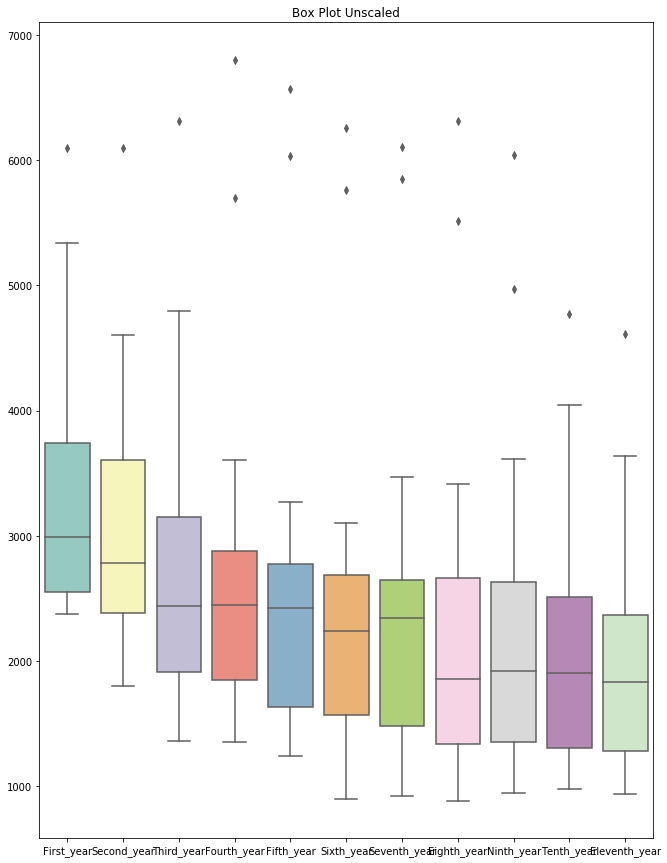

In [38]:
f, ax = plt.subplots(figsize=(11, 15))

ax.set_axis_bgcolor('#FFFFFF')
plt.title("Box Plot Unscaled")
ax.set(xlim=(-.05, 1.05))
ax = sns.boxplot(data = CrimeStatistics[1:29], 
  orient = 'Province',
  palette = 'Set3')

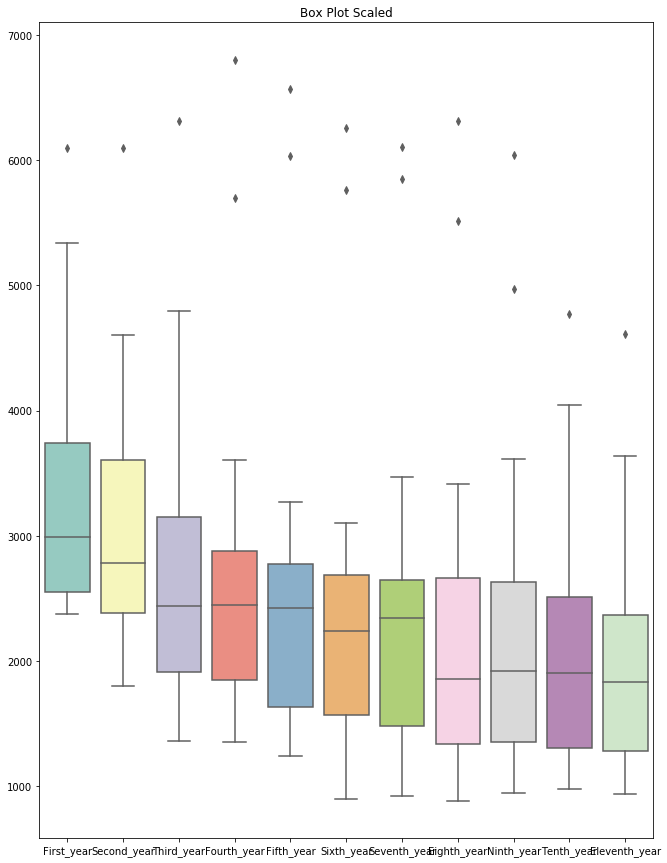

In [39]:
f, ax = plt.subplots(figsize=(11, 15))

ax.set_axis_bgcolor('#FFFFFF')
plt.title("Box Plot Scaled")
ax.set(xlim=(-.05, 1.05))
ax = sns.boxplot(data = CrimeStatistics_scaled[1:29], 
  orient = 'Province', 
  palette = 'Set3')

In [40]:

predictor_names=field_names_df[0].tolist()
predictor_names=CrimeStatistics.columns[3:]

predictor_names


Index(['First_year', 'Second_year', 'Third_year', 'Fourth_year', 'Fifth_year',
       'Sixth_year', 'Seventh_year', 'Eighth_year', 'Ninth_year', 'Tenth_year',
       'Eleventh_year'],
      dtype='object')

In [32]:
CrimeStatistics.columns[3:]

Index(['First_year', 'Second_year', 'Third_year', 'Fourth_year', 'Fifth_year',
       'Sixth_year', 'Seventh_year', 'Eighth_year', 'Ninth_year', 'Tenth_year',
       'Eleventh_year'],
      dtype='object')

In [44]:
def rank_predictors(dat,l,f='Province'):
    rank={}
    max_vals=dat.max()
    median_vals=dat.groupby(f).median()  # We are using the median as the mean is sensitive to outliers
    for p in l:
        score=np.abs((median_vals[p]['B']-median_vals[p]['M'])/max_vals[p])
        rank[p]=score
    return rank
cat_rank=rank_predictors(CrimeStatistics,predictor_names) 
cat_rank

KeyError: 'B'

In [45]:

cat_rank=sorted(cat_rank.items(), key=lambda x: x[1])
cat_rank

NameError: name 'cat_rank' is not defined

In [46]:
X = CrimeStatistics_scaled[predictor_names]
#setting target
y = CrimeStatistics_scaled["Province"]

In [47]:
print (X.shape)
print (y.shape)

(30861, 11)
(30861,)


In [48]:
type(X)


pandas.core.frame.DataFrame

In [49]:
type(y)


pandas.core.series.Series

In [51]:

%matplotlib inline 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import warnings
import random
from sklearn.cross_validation import KFold, cross_val_score, train_test_split
from sklearn import metrics
import statsmodels.api as sm
import scipy.stats as stats 
from sklearn.linear_model import LogisticRegression

from datetime import datetime
random.seed(datetime.now())
warnings.filterwarnings('ignore')

In [52]:
# setting Logistic regression classifier
# scikit-learn includes the intercept.

lr = LogisticRegression(C=1e9)

#dividing data to have a training and a testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= .2, random_state=0)

# Logistic regression metrics
LRm = lr.fit(X_train, y_train)

LRm.predict_proba(X_test)  # The returned estimates for all classes are ordered by the label of classes.

array([[ 0.1516826 ,  0.09781161,  0.11317819, ...,  0.07381276,
         0.06534389,  0.14127695],
       [ 0.16196261,  0.09645487,  0.10528862, ...,  0.07260143,
         0.09511484,  0.12794742],
       [ 0.17291368,  0.09272268,  0.1213145 , ...,  0.07252364,
         0.06717046,  0.13889369],
       ..., 
       [ 0.18536241,  0.10475155,  0.09780617, ...,  0.07299375,
         0.10099454,  0.11607154],
       [ 0.17020791,  0.09777626,  0.10750073, ...,  0.07083136,
         0.07729418,  0.1263789 ],
       [ 0.14478759,  0.08607498,  0.20173367, ...,  0.0759139 ,
         0.03077368,  0.1512628 ]])

In [53]:
LRm.coef_


array([[  1.91268190e-03,  -6.72054184e-04,   3.51193223e-03,
         -4.16877069e-03,  -1.47356548e-03,   1.56068373e-03,
          1.49366366e-03,  -1.02801087e-03,   2.91073093e-03,
         -1.81244139e-03,  -5.28339611e-03],
       [  5.30732218e-03,  -6.92186977e-03,   2.48679733e-03,
          2.79519350e-03,  -2.80835845e-03,  -2.95531172e-03,
          1.14097679e-03,   4.25843081e-03,   1.31288125e-03,
         -3.76783708e-03,  -3.75235541e-03],
       [  5.47328470e-04,  -6.23176665e-04,  -1.94759988e-03,
          2.74079457e-03,   3.08456217e-03,   2.25229756e-03,
         -4.65238335e-03,  -5.84873851e-03,   3.09526524e-03,
          1.77472571e-03,   1.70354159e-03],
       [ -9.66966483e-04,   2.06046877e-03,  -2.18075835e-03,
         -1.44468421e-04,   7.76406226e-04,   5.25779533e-04,
         -9.22498159e-04,   3.22563910e-03,  -8.00300676e-04,
         -8.62231826e-04,  -9.34903478e-04],
       [  1.10144078e-03,   1.60478289e-03,  -1.12358227e-03,
         -2.01

In [54]:
LRm.intercept_


array([-1.42824399, -2.09813567, -2.1748409 , -1.63995614, -2.26346706,
       -2.4523034 , -2.49587293, -2.13905115, -1.98217371])

In [55]:
LRm.decision_function(X_test) # Predict confidence scores for samples.


array([[-1.79190768, -2.28815333, -2.12616596, ..., -2.59425266,
        -2.72465465, -1.8743427 ],
       [-1.62520337, -2.22010937, -2.12248372, ..., -2.53070195,
        -2.23560718, -1.90146433],
       [-1.62365526, -2.33433554, -2.03523491, ..., -2.60092006,
        -2.6830614 , -1.88079898],
       ..., 
       [-1.42824399, -2.09813567, -2.1748409 , ..., -2.49587293,
        -2.13905115, -1.98217371],
       [-1.61400643, -2.24966872, -2.14431151, ..., -2.60068989,
        -2.50657782, -1.96173757],
       [-1.92650241, -2.50393799, -1.5358275 , ..., -2.63916262,
        -3.58369423, -1.87621614]])

In [56]:
LRm.predict(X_test)


array(['Kwazulu/Natal', 'Eastern Cape', 'Eastern Cape', ...,
       'Eastern Cape', 'Kwazulu/Natal', 'Gauteng'], dtype=object)

In [57]:
y_pred = LRm.predict(X_test)
print("Accuracy score using Logistic regression is %s" %metrics.accuracy_score(y_test, y_pred))

Accuracy score using Logistic regression is 0.216750364491


In [58]:
k=5
acc=[]
for i in range(k):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state=i)
    # Logistic regression metrics
    LRm = lr.fit(X_train, y_train)
    a=metrics.accuracy_score(y_test, LRm.predict(X_test))
    acc.append(a)
    
print (acc)
print (np.mean(acc))
print (np.std(acc))

[0.21675036449052323, 0.21691236027863275, 0.21124250769479994, 0.20865057508504778, 0.21108051190669042]
0.212927263891
0.00331771170803


In [61]:
# import some data to play with
CrimeStatistics = pd.read_csv('CrimeStatistics.csv', header=0)
X = CrimeStatistics.data[:, :2]   # we only take the first two features.
Y = CrimeStatistics.target # iris.target has three classes.

AttributeError: 'DataFrame' object has no attribute 'data'

In [36]:
dummy_ranks = pd.get_dummies(CrimeStatistics['Category'], prefix='Category')
dummy_ranks.head(10)

,Category_All theft not mentioned elsewhere,Category_Arson,Category_Assault with the intent to inflict grievous bodily harm,Category_Attempted murder,Category_Bank robbery,Category_Burglary at non-residential premises,Category_Burglary at residential premises,Category_Carjacking,Category_Commercial crime,Category_Common assault,...,Category_Robbery at residential premises,Category_Robbery of cash in transit,Category_Robbery with aggravating circumstances,Category_Sexual Offences,Category_Sexual offences as result of police action,Category_Shoplifting,Category_Stock-theft,Category_Theft of motor vehicle and motorcycle,Category_Theft out of or from motor vehicle,Category_Truck hijacking
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [37]:
keep = ['First_year', 'Second_year', 'Category']
CrimeStatistics_dummy = CrimeStatistics[keep].join(dummy_ranks.ix[:, 'Province_2':])
CrimeStatistics_dummy.head()

,First_year,Second_year,Category
0,6692,6341,All theft not mentioned elsewhere
1,6093,4602,All theft not mentioned elsewhere
2,5341,6093,All theft not mentioned elsewhere
3,5108,4282,All theft not mentioned elsewhere
4,5099,4536,All theft not mentioned elsewhere
